## Sebelum Kita melakukan pengolahan pada data ini maka ada hal-hal yang harus kita lakukan yaitu menentukan data yang kita miliki ini mau diapakan, maka sebelum itu biasanya kita memiliki beberapa pertanyaan yang terlintas sebagai dugaan awal dan pertanyaan-pertanyaan yang nantinya akan terjawab saat kita sudah mulai memproses data 

## Hipotesis sementara 
### Dalam kasus ini berdasarkan Penjualan Properti NYC pada tahun 2016 menjadi tahun yang paling banyak Aktivitas transaksi yang terjadi karena ditahun ini saya rasa masih stabil perekonomian di dunia termasuk di NYC.

## Daftar Pertanyaan
### 1.Apa saja atribut/kolom yang terkadung pada DataFrame ini Penjualan Properti NYC.
### 2.Apakah DataFrame ini sudah bersih atau masih harus melakukan pembersihan terlebih dahulu.
### 3.Bagaimana Mean,Median,Modus,Rentang,Varian,dan Standart Deviansi nya.
### 4.Bagaimana Tren Harga Jual Properti dari Waktu ke Waktu
### 5.Bagaimana Aktivitas Transaksi Bulanan
### 6.Bagaimana Harga maximal dan Minimal penjualan rumahnya
### 7.Bagaimana Jumlah dan Frekuensi Jenis Transaksi - TAX CLASS dan BUILDING CLASS
### 8.Bagaimana Distribusi Jenis Bangunan
### 9.Visualisasikan Jumlah Properti di Setiap Lingkungan (NEIGHBORHOOD) dan Jumlah Properti di Setiap Borough
### 10.Bagaimana Heatmap Korelasinya
### 11.Bagaimana Perbandingan Rata-rata Harga Penjualan Berdasarkan Jenis Bangunan
### 12.Bagaimana Distribusi Tahun Pembangunan visualisasikan
### 13.Viaualisasikan Uniform Distribution,Normal Distribution,Gamma Distribution,Poisson Distribution,Binomial Distribution berdasarkan sale price
### 14.Bagaimana Perbandingan Jumlah Total Unit Terjual antara Tahun 1900-2000 dan 2001-dan Seterusnya
### 15.Bagaimana Perbandingan Jumlah Total Unit Terjual antara Tahun 1900-2000 dan 2001-dan Seterusnya 
### 16.Bagaimana Volume Transaksi Properti per Tanggal
### 17.Viaualisasikan Convidance Interval

# Import modul yang diperlukan

Pada setiap kasus sebelum kita memproses ke tahap selanjutnya maka harus mengimport/install modul akan dipakai akan mempermudah

In [1]:
import math
import statistics as st
import numpy as np
import scipy.stats as ss
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.figure_factory as ff
import statsmodels.api as sm
from scipy.stats import uniform
from scipy import stats
from IPython.display import Math, Latex
from IPython.core.display import Image 
sns.set(color_codes=True)
from tabulate import tabulate
from IPython.display import display, HTML
from scipy.stats import ttest_ind
from scipy.stats import f_oneway

C:\ProgramData\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


# Memanggil dataFrame

Setelah mengimport/install modul maka kita akan memanggil DataFrame yang akan kita gunakan pada kasus ini menggunakan DataFrame  Penjualan Properti NYC dari kaggle.

In [2]:
df = pd.read_csv('nyc-rolling-sales.csv')

In [3]:
# PERINTAH INI UNTUK MELIHAT INFO YANG ADA PADA DATAFRAME YANG KITA GUNAKAN YANG BERISI BANYAK KOLOM DAN BARIS DAN TYPE DATA
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84548 entries, 0 to 84547
Data columns (total 22 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   Unnamed: 0                      84548 non-null  int64 
 1   BOROUGH                         84548 non-null  int64 
 2   NEIGHBORHOOD                    84548 non-null  object
 3   BUILDING CLASS CATEGORY         84548 non-null  object
 4   TAX CLASS AT PRESENT            84548 non-null  object
 5   BLOCK                           84548 non-null  int64 
 6   LOT                             84548 non-null  int64 
 7   EASE-MENT                       84548 non-null  object
 8   BUILDING CLASS AT PRESENT       84548 non-null  object
 9   ADDRESS                         84548 non-null  object
 10  APARTMENT NUMBER                84548 non-null  object
 11  ZIP CODE                        84548 non-null  int64 
 12  RESIDENTIAL UNITS               84548 non-null

Berdasarkan Info maka terdapat atribut yaitu Unnamed: 0	BOROUGH	NEIGHBORHOOD	BUILDING CLASS CATEGORY	TAX CLASS AT PRESENT	BLOCK	LOT	EASE-MENT	BUILDING CLASS AT PRESENT	ADDRESS	...	RESIDENTIAL UNITS	COMMERCIAL UNITS	TOTAL UNITS	LAND SQUARE FEET	GROSS SQUARE FEET	YEAR BUILT	TAX CLASS AT TIME OF SALE	BUILDING CLASS AT TIME OF SALE	SALE PRICE	SALE DATE dan pada data ini terdapat total 22 columns

In [4]:
#UNTUK MELIHAT 5 DATA TERATAS 
df.head()

,Unnamed: 0,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,EASE-MENT,BUILDING CLASS AT PRESENT,ADDRESS,...,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE
0,4,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,392,6,,C2,153 AVENUE B,...,5,0,5,1633,6440,1900,2,C2,6625000,2017-07-19 00:00:00
1,5,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,26,,C7,234 EAST 4TH STREET,...,28,3,31,4616,18690,1900,2,C7,-,2016-12-14 00:00:00
2,6,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,39,,C7,197 EAST 3RD STREET,...,16,1,17,2212,7803,1900,2,C7,-,2016-12-09 00:00:00
3,7,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2B,402,21,,C4,154 EAST 7TH STREET,...,10,0,10,2272,6794,1913,2,C4,3936272,2016-09-23 00:00:00
4,8,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,404,55,,C2,301 EAST 10TH STREET,...,6,0,6,2369,4615,1900,2,C2,8000000,2016-11-17 00:00:00


Berdasarkan isi dari DataFrame ini terdapat beberapa hal yang tidak digunakan jadi lebih baik dihapus 

In [5]:
# First thing that seems utterly inutile! is 'Unnamed: 0' column
df.drop(['Unnamed: 0'], axis=1, inplace=True)

In [6]:
# Konversi kolom 'SALE PRICE' ke tipe data numerik
df['SALE PRICE'] = pd.to_numeric(df['SALE PRICE'], errors='coerce')

# Menggantikan nilai-nilai negatif atau tidak valid dengan NaN
df['SALE PRICE'] = df['SALE PRICE'].apply(lambda x: np.nan if (np.isnan(x) or x < 0) else x)

In [7]:
# Menggantikan nilai-nilai negatif atau tidak valid dengan NaN
df['SALE PRICE'] = df['SALE PRICE'].apply(lambda x: np.nan if x < 0 else x)

# Menggantikan nilai-nilai NaN dengan rata-rata berdasarkan BUILDING CLASS AT TIME OF SALE
df['SALE PRICE'] = df.groupby('BUILDING CLASS AT TIME OF SALE')['SALE PRICE'].transform(lambda x: x.fillna(x.mean()))

In [8]:
df.head()

,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,EASE-MENT,BUILDING CLASS AT PRESENT,ADDRESS,APARTMENT NUMBER,...,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE
0,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,392,6,,C2,153 AVENUE B,,...,5,0,5,1633,6440,1900,2,C2,6.625000e+06,2017-07-19 00:00:00
1,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,26,,C7,234 EAST 4TH STREET,,...,28,3,31,4616,18690,1900,2,C7,6.242565e+06,2016-12-14 00:00:00
2,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,39,,C7,197 EAST 3RD STREET,,...,16,1,17,2212,7803,1900,2,C7,6.242565e+06,2016-12-09 00:00:00
3,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2B,402,21,,C4,154 EAST 7TH STREET,,...,10,0,10,2272,6794,1913,2,C4,3.936272e+06,2016-09-23 00:00:00
4,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,404,55,,C2,301 EAST 10TH STREET,,...,6,0,6,2369,4615,1900,2,C2,8.000000e+06,2016-11-17 00:00:00


Setelah dihapus data terlihat lebih bersih

In [9]:
#UNTUK MELIHAT NULL 
df.isnull().sum()

BOROUGH                           0
NEIGHBORHOOD                      0
BUILDING CLASS CATEGORY           0
TAX CLASS AT PRESENT              0
BLOCK                             0
LOT                               0
EASE-MENT                         0
BUILDING CLASS AT PRESENT         0
ADDRESS                           0
APARTMENT NUMBER                  0
ZIP CODE                          0
RESIDENTIAL UNITS                 0
COMMERCIAL UNITS                  0
TOTAL UNITS                       0
LAND SQUARE FEET                  0
GROSS SQUARE FEET                 0
YEAR BUILT                        0
TAX CLASS AT TIME OF SALE         0
BUILDING CLASS AT TIME OF SALE    0
SALE PRICE                        8
SALE DATE                         0
dtype: int64

Berdasarkan hasil untuk melihat null maka di kolom SALE PRICE terdapat 8 null maka harus dibersihkan terlebih dahulu

In [10]:
# Menggantikan nilai-nilai NaN dengan rata-rata dari kolom 'SALE PRICE'
average_sale_price = df['SALE PRICE'].astype(float).mean()
df['SALE PRICE'] = df['SALE PRICE'].fillna(average_sale_price)

In [11]:
df.isnull().sum()

BOROUGH                           0
NEIGHBORHOOD                      0
BUILDING CLASS CATEGORY           0
TAX CLASS AT PRESENT              0
BLOCK                             0
LOT                               0
EASE-MENT                         0
BUILDING CLASS AT PRESENT         0
ADDRESS                           0
APARTMENT NUMBER                  0
ZIP CODE                          0
RESIDENTIAL UNITS                 0
COMMERCIAL UNITS                  0
TOTAL UNITS                       0
LAND SQUARE FEET                  0
GROSS SQUARE FEET                 0
YEAR BUILT                        0
TAX CLASS AT TIME OF SALE         0
BUILDING CLASS AT TIME OF SALE    0
SALE PRICE                        0
SALE DATE                         0
dtype: int64

Setelah data sudah bersih maka lanjut ke proses berikutnya 

In [12]:
df.head()

,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,EASE-MENT,BUILDING CLASS AT PRESENT,ADDRESS,APARTMENT NUMBER,...,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE
0,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,392,6,,C2,153 AVENUE B,,...,5,0,5,1633,6440,1900,2,C2,6.625000e+06,2017-07-19 00:00:00
1,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,26,,C7,234 EAST 4TH STREET,,...,28,3,31,4616,18690,1900,2,C7,6.242565e+06,2016-12-14 00:00:00
2,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,39,,C7,197 EAST 3RD STREET,,...,16,1,17,2212,7803,1900,2,C7,6.242565e+06,2016-12-09 00:00:00
3,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2B,402,21,,C4,154 EAST 7TH STREET,,...,10,0,10,2272,6794,1913,2,C4,3.936272e+06,2016-09-23 00:00:00
4,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,404,55,,C2,301 EAST 10TH STREET,,...,6,0,6,2369,4615,1900,2,C2,8.000000e+06,2016-11-17 00:00:00


## Mencari count,mean,std,min,25%,50%,75%,max

CARA 1

In [13]:
# SEBENARNYA DENGAN PERINTAH INI KITA SUDAH BISA MENDAPATKAN HASIL UNTUK count,mean,std,min,25%,50%,75%,max
df.describe()

,BOROUGH,BLOCK,LOT,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,YEAR BUILT,TAX CLASS AT TIME OF SALE,SALE PRICE
count,84548.000000,84548.000000,84548.000000,84548.000000,84548.000000,84548.000000,84548.000000,84548.000000,84548.000000,8.454800e+04
mean,2.998758,4237.218976,376.224015,10731.991614,2.025264,0.193559,2.249184,1789.322976,1.657485,1.346737e+06
std,1.289790,3568.263407,658.136814,1290.879147,16.721037,8.713183,18.972584,537.344993,0.819341,1.135856e+07
min,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000e+00
25%,2.000000,1322.750000,22.000000,10305.000000,0.000000,0.000000,1.000000,1920.000000,1.000000,2.800000e+05
50%,3.000000,3311.000000,50.000000,11209.000000,1.000000,0.000000,1.000000,1940.000000,2.000000,5.670890e+05
75%,4.000000,6281.000000,1001.000000,11357.000000,2.000000,0.000000,2.000000,1965.000000,2.000000,9.700000e+05
max,5.000000,16322.000000,9106.000000,11694.000000,1844.000000,2261.000000,2261.000000,2017.000000,4.000000,2.210000e+09


CARA 2

In [14]:
#MENGHITUNG MEAN
# Menghitung mean menggunakan pandas
mean_pandas = df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                   'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                   'TAX CLASS AT TIME OF SALE', 'SALE PRICE']].mean(axis=0)

# Menghitung mean menggunakan numpy
mean_numpy = np.mean(df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                          'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                          'TAX CLASS AT TIME OF SALE', 'SALE PRICE']].dropna())

# Menghitung mean menggunakan scipy
mean_scipy = stats.describe(df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                                'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                                'TAX CLASS AT TIME OF SALE', 'SALE PRICE']].dropna()).mean

print("Mean menggunakan Pandas:", mean_pandas)
print("Mean menggunakan NumPy:", mean_numpy)
print("Mean menggunakan SciPy:", mean_scipy)

Mean menggunakan Pandas: BOROUGH                      2.998758e+00
BLOCK                        4.237219e+03
LOT                          3.762240e+02
ZIP CODE                     1.073199e+04
RESIDENTIAL UNITS            2.025264e+00
COMMERCIAL UNITS             1.935587e-01
TOTAL UNITS                  2.249184e+00
YEAR BUILT                   1.789323e+03
TAX CLASS AT TIME OF SALE    1.657485e+00
SALE PRICE                   1.346737e+06
dtype: float64
Mean menggunakan NumPy: BOROUGH                      2.998758e+00
BLOCK                        4.237219e+03
LOT                          3.762240e+02
ZIP CODE                     1.073199e+04
RESIDENTIAL UNITS            2.025264e+00
COMMERCIAL UNITS             1.935587e-01
TOTAL UNITS                  2.249184e+00
YEAR BUILT                   1.789323e+03
TAX CLASS AT TIME OF SALE    1.657485e+00
SALE PRICE                   1.346737e+06
dtype: float64
Mean menggunakan SciPy: [2.99875810e+00 4.23721898e+03 3.76224015e+02 1.07319916e

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


In [15]:
#MENGHITUNG MODUS
# Menghitung Modus menggunakan Pandas
modus_pandas = df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                   'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                   'TAX CLASS AT TIME OF SALE', 'SALE PRICE']].mode(axis=0, dropna=True).iloc[0]

# Menghitung Modus menggunakan NumPy
modus_numpy = stats.mode(df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                             'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                             'TAX CLASS AT TIME OF SALE', 'SALE PRICE']].dropna(), axis=0, keepdims=True).mode[0]

# Menghitung Modus menggunakan SciPy
modus_scipy = stats.mode(df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                             'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                             'TAX CLASS AT TIME OF SALE', 'SALE PRICE']].dropna(), axis=0)

# Menampilkan hasil
print("Modus menggunakan Pandas:")
print(modus_pandas)
print("\nModus menggunakan NumPy:")
print(modus_numpy)
print("\nModus menggunakan SciPy:")
print(modus_scipy.mode)

Modus menggunakan Pandas:
BOROUGH                          4.0
BLOCK                         5066.0
LOT                              1.0
ZIP CODE                     10314.0
RESIDENTIAL UNITS                1.0
COMMERCIAL UNITS                 0.0
TOTAL UNITS                      1.0
YEAR BUILT                       0.0
TAX CLASS AT TIME OF SALE        1.0
SALE PRICE                       0.0
Name: 0, dtype: float64

Modus menggunakan NumPy:
[4.0000e+00 5.0660e+03 1.0000e+00 1.0314e+04 1.0000e+00 0.0000e+00
 1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00]

Modus menggunakan SciPy:
[[4.0000e+00 5.0660e+03 1.0000e+00 1.0314e+04 1.0000e+00 0.0000e+00
  1.0000e+00 0.0000e+00 1.0000e+00 0.0000e+00]]


C:\Users\LENOVO\AppData\Local\Temp\ipykernel_3324\725811365.py:13: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  modus_scipy = stats.mode(df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS',


In [16]:
#MENGHITUNG MEDIAN
# Menghitung Median menggunakan Pandas
median_pandas = df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                     'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                     'TAX CLASS AT TIME OF SALE', 'SALE PRICE']].median(axis=0)

# Menghitung Median menggunakan NumPy
median_numpy = np.median(df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                             'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                             'TAX CLASS AT TIME OF SALE', 'SALE PRICE']].dropna(), axis=0)

# Menghitung Median menggunakan SciPy
median_scipy = stats.describe(df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                                 'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                                 'TAX CLASS AT TIME OF SALE', 'SALE PRICE']].dropna()).minmax[0]

# Menampilkan hasil
print("Median menggunakan Pandas:")
print(median_pandas)
print("\nMedian menggunakan NumPy:")
print(median_numpy)
print("\nMedian menggunakan SciPy:")
print(median_scipy)

Median menggunakan Pandas:
BOROUGH                           3.000000
BLOCK                          3311.000000
LOT                              50.000000
ZIP CODE                      11209.000000
RESIDENTIAL UNITS                 1.000000
COMMERCIAL UNITS                  0.000000
TOTAL UNITS                       1.000000
YEAR BUILT                     1940.000000
TAX CLASS AT TIME OF SALE         2.000000
SALE PRICE                   567088.981562
dtype: float64

Median menggunakan NumPy:
[3.00000000e+00 3.31100000e+03 5.00000000e+01 1.12090000e+04
 1.00000000e+00 0.00000000e+00 1.00000000e+00 1.94000000e+03
 2.00000000e+00 5.67088982e+05]

Median menggunakan SciPy:
[1. 1. 1. 0. 0. 0. 0. 0. 1. 0.]


In [17]:
# MENGHITUNG RANGE 
# Menghitung Range menggunakan Pandas
range_pandas = df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                    'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                    'TAX CLASS AT TIME OF SALE', 'SALE PRICE']].max() - df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                                                                            'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                                                                            'TAX CLASS AT TIME OF SALE', 'SALE PRICE']].min()

# Menghitung Range menggunakan NumPy
range_numpy = np.ptp(df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                        'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                        'TAX CLASS AT TIME OF SALE', 'SALE PRICE']].dropna(), axis=0)

# Menghitung Range menggunakan SciPy
range_scipy = stats.describe(df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                                 'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                                 'TAX CLASS AT TIME OF SALE', 'SALE PRICE']].dropna()).minmax[1] - stats.describe(df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                                                                                                                         'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                                                                                                                         'TAX CLASS AT TIME OF SALE', 'SALE PRICE']].dropna()).minmax[0]

# Menampilkan hasil
print("Range menggunakan Pandas:")
print(range_pandas)
print("\nRange menggunakan NumPy:")
print(range_numpy)
print("\nRange menggunakan SciPy:")
print(range_scipy)

Range menggunakan Pandas:
BOROUGH                      4.000000e+00
BLOCK                        1.632100e+04
LOT                          9.105000e+03
ZIP CODE                     1.169400e+04
RESIDENTIAL UNITS            1.844000e+03
COMMERCIAL UNITS             2.261000e+03
TOTAL UNITS                  2.261000e+03
YEAR BUILT                   2.017000e+03
TAX CLASS AT TIME OF SALE    3.000000e+00
SALE PRICE                   2.210000e+09
dtype: float64

Range menggunakan NumPy:
BOROUGH                      4.000000e+00
BLOCK                        1.632100e+04
LOT                          9.105000e+03
ZIP CODE                     1.169400e+04
RESIDENTIAL UNITS            1.844000e+03
COMMERCIAL UNITS             2.261000e+03
TOTAL UNITS                  2.261000e+03
YEAR BUILT                   2.017000e+03
TAX CLASS AT TIME OF SALE    3.000000e+00
SALE PRICE                   2.210000e+09
dtype: float64

Range menggunakan SciPy:
[4.0000e+00 1.6321e+04 9.1050e+03 1.1694e+04 1.8440e

In [18]:

# Pilih kolom-kolom numerik
numeric_columns = ['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                   'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                   'TAX CLASS AT TIME OF SALE', 'SALE PRICE']

# Hitung statistik deskriptif
descriptive_stats = df[numeric_columns].describe()

# Tampilkan hasil
print(descriptive_stats)

# Hitung metrik tambahan
mean_values = df[numeric_columns].mean()
median_values = df[numeric_columns].median()
std_values = df[numeric_columns].std()

# Tampilkan hasil
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nStandard Deviation Values:")
print(std_values)

            BOROUGH         BLOCK           LOT      ZIP CODE  \
count  84548.000000  84548.000000  84548.000000  84548.000000   
mean       2.998758   4237.218976    376.224015  10731.991614   
std        1.289790   3568.263407    658.136814   1290.879147   
min        1.000000      1.000000      1.000000      0.000000   
25%        2.000000   1322.750000     22.000000  10305.000000   
50%        3.000000   3311.000000     50.000000  11209.000000   
75%        4.000000   6281.000000   1001.000000  11357.000000   
max        5.000000  16322.000000   9106.000000  11694.000000   

       RESIDENTIAL UNITS  COMMERCIAL UNITS   TOTAL UNITS    YEAR BUILT  \
count       84548.000000      84548.000000  84548.000000  84548.000000   
mean            2.025264          0.193559      2.249184   1789.322976   
std            16.721037          8.713183     18.972584    537.344993   
min             0.000000          0.000000      0.000000      0.000000   
25%             0.000000          0.000000  

In [19]:
# MENGHITUNG VARIANS
# Menghitung Varians menggunakan Pandas
varians_pandas = df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                      'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                      'TAX CLASS AT TIME OF SALE', 'SALE PRICE']].var()

# Menghitung Varians menggunakan NumPy
varians_numpy = np.var(df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                            'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                            'TAX CLASS AT TIME OF SALE', 'SALE PRICE']].dropna(), axis=0)

# Menghitung Varians menggunakan SciPy
varians_scipy = stats.describe(df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                                   'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                                   'TAX CLASS AT TIME OF SALE', 'SALE PRICE']].dropna()).variance

# Menampilkan hasil
print("Varians menggunakan Pandas:")
print(varians_pandas)
print("\nVarians menggunakan NumPy:")
print(varians_numpy)
print("\nVarians menggunakan SciPy:")
print(varians_scipy)

Varians menggunakan Pandas:
BOROUGH                      1.663558e+00
BLOCK                        1.273250e+07
LOT                          4.331441e+05
ZIP CODE                     1.666369e+06
RESIDENTIAL UNITS            2.795931e+02
COMMERCIAL UNITS             7.591956e+01
TOTAL UNITS                  3.599590e+02
YEAR BUILT                   2.887396e+05
TAX CLASS AT TIME OF SALE    6.713200e-01
SALE PRICE                   1.290169e+14
dtype: float64

Varians menggunakan NumPy:
BOROUGH                      1.663539e+00
BLOCK                        1.273235e+07
LOT                          4.331389e+05
ZIP CODE                     1.666349e+06
RESIDENTIAL UNITS            2.795898e+02
COMMERCIAL UNITS             7.591867e+01
TOTAL UNITS                  3.599547e+02
YEAR BUILT                   2.887362e+05
TAX CLASS AT TIME OF SALE    6.713121e-01
SALE PRICE                   1.290154e+14
dtype: float64

Varians menggunakan SciPy:
[1.66355837e+00 1.27325037e+07 4.33144066e+05 

In [20]:
# MENGHITUNG STANDART DEVIANSI
# Menghitung standar deviasi menggunakan pandas
std_pandas = df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                 'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                 'TAX CLASS AT TIME OF SALE', 'SALE PRICE']].std()

# Menghitung standar deviasi menggunakan numpy
std_numpy = np.std(df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                       'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                       'TAX CLASS AT TIME OF SALE', 'SALE PRICE']].dropna(), ddof=1)  # ddof=1 untuk menggunakan metode sample standard deviation

# Menghitung standar deviasi menggunakan scipy
std_scipy = np.sqrt(stats.describe(df[['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                                       'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                                       'TAX CLASS AT TIME OF SALE', 'SALE PRICE']].dropna()).variance)

print("Standar Deviasi menggunakan Pandas:")
print(std_pandas)
print("\nStandar Deviasi menggunakan NumPy:")
print(std_numpy)
print("\nStandar Deviasi menggunakan SciPy:")
print(std_scipy)

Standar Deviasi menggunakan Pandas:
BOROUGH                      1.289790e+00
BLOCK                        3.568263e+03
LOT                          6.581368e+02
ZIP CODE                     1.290879e+03
RESIDENTIAL UNITS            1.672104e+01
COMMERCIAL UNITS             8.713183e+00
TOTAL UNITS                  1.897258e+01
YEAR BUILT                   5.373450e+02
TAX CLASS AT TIME OF SALE    8.193412e-01
SALE PRICE                   1.135856e+07
dtype: float64

Standar Deviasi menggunakan NumPy:
BOROUGH                      1.289790e+00
BLOCK                        3.568263e+03
LOT                          6.581368e+02
ZIP CODE                     1.290879e+03
RESIDENTIAL UNITS            1.672104e+01
COMMERCIAL UNITS             8.713183e+00
TOTAL UNITS                  1.897258e+01
YEAR BUILT                   5.373450e+02
TAX CLASS AT TIME OF SALE    8.193412e-01
SALE PRICE                   1.135856e+07
dtype: float64

Standar Deviasi menggunakan SciPy:
[1.28979005e+00 3.5682

CARA 3

In [21]:
# Pilih kolom-kolom numerik
numeric_columns = ['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                   'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                   'TAX CLASS AT TIME OF SALE', 'SALE PRICE']

# Hitung statistik deskriptif
descriptive_stats = df[numeric_columns].describe().transpose()

# Tampilkan hasil menggunakan tabulate dan IPython.display
table_html = tabulate(descriptive_stats, tablefmt='html', headers='keys')
display(HTML(table_html))

,count,mean,std,min,25%,50%,75%,max
BOROUGH,84548,2.99876,1.28979,1,2,3,4,5
BLOCK,84548,4237.22,3568.26,1,1322.75,3311,6281,16322
LOT,84548,376.224,658.137,1,22,50,1001,9106
ZIP CODE,84548,10732,1290.88,0,10305,11209,11357,11694
RESIDENTIAL UNITS,84548,2.02526,16.721,0,0,1,2,1844
COMMERCIAL UNITS,84548,0.193559,8.71318,0,0,0,0,2261
TOTAL UNITS,84548,2.24918,18.9726,0,1,1,2,2261
YEAR BUILT,84548,1789.32,537.345,0,1920,1940,1965,2017
TAX CLASS AT TIME OF SALE,84548,1.65748,0.819341,1,1,2,2,4
SALE PRICE,84548,1.34674e+06,1.13586e+07,0,280000,567089,970000,2.21e+09


### Menghitung Tren Harga Jual Properti dari Waktu ke Waktu

In [22]:
# Membuat plotly express line chart
fig = px.line(df, x='SALE DATE', y='SALE PRICE', markers=True,
              title='Tren Harga Jual Properti dari Waktu ke Waktu',
              labels={'SALE DATE': 'Tanggal Penjualan', 'SALE PRICE': 'Harga Jual'})

# Menambahkan grid
fig.update_layout(xaxis=dict(showgrid=True), yaxis=dict(showgrid=True))

# Menampilkan plot
fig.show()

Ini adalah hasil Visualisasi Tren Harga Jual Properti dari Waktu ke Waktu dengan tanggal penjualan tertinggi pada 5 Mei 2017 dengan harga jual 2.21B

### Menghitung Tren Penjualan dan Harga Seiring Waktu

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_3324\2950928666.py:8: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



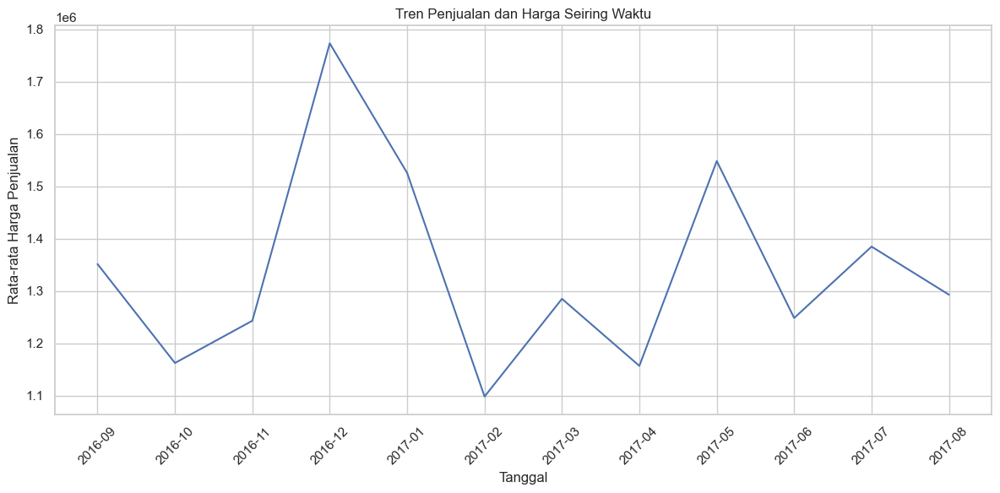

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_3324\2950928666.py:34: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [23]:
# Mengubah kolom "SALE DATE" menjadi format datetime
df['SALE DATE'] = pd.to_datetime(df['SALE DATE'], errors='coerce')

# Mengubah kolom "SALE PRICE" menjadi format numerik
df['SALE PRICE'] = pd.to_numeric(df['SALE PRICE'], errors='coerce')

# Mengelompokkan data berdasarkan bulan
df_grouped = df.groupby(df['SALE DATE'].dt.to_period("M")).mean()

# Setel gaya plot
sns.set(style="whitegrid")

# Membuat plot
plt.figure(figsize=(12, 6))
sns.lineplot(x=df_grouped.index.astype(str), y='SALE PRICE', data=df_grouped)

# Menambahkan label dan judul
plt.title('Tren Penjualan dan Harga Seiring Waktu')
plt.xlabel('Tanggal')
plt.ylabel('Rata-rata Harga Penjualan')

# Menampilkan plot
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Mengubah kolom "SALE DATE" menjadi format datetime
df['SALE DATE'] = pd.to_datetime(df['SALE DATE'], errors='coerce')

# Mengubah kolom "SALE PRICE" menjadi format numerik
df['SALE PRICE'] = pd.to_numeric(df['SALE PRICE'], errors='coerce')

# Mengelompokkan data berdasarkan bulan
df_grouped = df.groupby(df['SALE DATE'].dt.to_period("M")).mean().reset_index()

# Mengonversi Period ke format tanggal
df_grouped['SALE DATE'] = df_grouped['SALE DATE'].dt.to_timestamp()

# Membuat plot interaktif dengan Plotly Express
fig = px.line(df_grouped, x='SALE DATE', y='SALE PRICE',
              labels={'SALE PRICE': 'Rata-rata Harga Penjualan'},
              title='Tren Penjualan dan Harga Seiring Waktu')

# Menambahkan label pada sumbu x
fig.update_xaxes(title_text='Tanggal', tickangle=45)

# Menampilkan plot
fig.show()

Ini adalah Hasil Visualisasi Tren Penjualan dan Harga Seiring Waktu dengan waktu penjualan 1 desember 2016 dengan Rata-rata herga penjualan 1.773058M

### Menghitung Aktivitas Transaksi Bulanan

In [24]:
# Menambahkan kolom bulan dan tahun ke DataFrame
df['Month'] = df['SALE DATE'].dt.month
df['Year'] = df['SALE DATE'].dt.year

# Agregasi data berdasarkan bulan
monthly_activity = df.groupby(['Year', 'Month']).size().reset_index(name='Transaction Count')

# Mengurutkan DataFrame berdasarkan tahun dan bulan
monthly_activity = monthly_activity.sort_values(by=['Year', 'Month'])

# Membuat plot menggunakan Plotly Express
fig = px.line(monthly_activity, x='Month', y='Transaction Count', color='Year',
              title='Aktivitas Transaksi Bulanan',
              labels={'Transaction Count': 'Jumlah Transaksi', 'Month': 'Bulan', 'Year': 'Tahun'})

# Menampilkan plot
fig.show()

Aktivitas transaksi jualan pada tahun 2016 tertinggi pada bulan 12 dengan jumlah transaksi 7891 dan pada terendag pada bulan 10 dengan jumlah transaksi 6751.Sedangkan.

Aktivitas transaksi jualan pada tahun 2017 tertinggi pada bulan 06 dengan jumlah transaksi 8293 dan pada terendag pada bulan 08 dengan jumlah transaksi 5681.

### Melihat Harga maximal dan Minimal penjualan berdasarkan kolom BUILDING CLASS AT PRESENT

In [25]:
# MELIHAT ISI DARI KOLOM BUILDING CLASS AT PRESENT
unique_building_classes = df['BUILDING CLASS AT PRESENT'].unique()
print(unique_building_classes)

['C2' 'C7' 'C4' 'D5' 'D9' 'D7' 'D1' 'C6' 'D0' 'D4' 'RR' ' ' 'R2' 'R4' 'S3'
 'S4' 'S5' 'R1' 'R8' 'R9' 'K4' 'M9' 'M3' 'RK' 'RS' 'A9' 'A4' 'B3' 'B1'
 'S2' 'C0' 'R6' 'C5' 'C3' 'C1' 'D6' 'S9' 'O2' 'O1' 'O3' 'O5' 'O6' 'K1'
 'K2' 'L9' 'L8' 'L1' 'H1' 'H8' 'H3' 'R5' 'G6' 'P7' 'M1' 'N2' 'RB' 'RG'
 'RT' 'K9' 'V1' 'GW' 'G2' 'I7' 'M4' 'Z9' 'B9' 'D3' 'G9' 'I9' 'U6' 'O4'
 'L3' 'H2' 'E1' 'Z3' 'RW' 'C9' 'J5' 'N9' 'S1' 'A5' 'J8' 'B2' 'C8' 'F5'
 'Q1' 'G7' 'G5' 'G4' 'P2' 'Q9' 'Y1' 'RA' 'RP' 'O8' 'HR' 'G1' 'E7' 'I5'
 'R3' 'I4' 'H9' 'RH' 'D8' 'HB' 'J4' 'W2' 'P9' 'A7' 'D2' 'S0' 'O7' 'O9'
 'W3' 'HS' 'H6' 'J9' 'R0' 'HH' 'W8' 'W6' 'A1' 'K5' 'F1' 'V9' 'A2' 'V0'
 'G0' 'F4' 'E9' 'I3' 'W4' 'V3' 'I1' 'A6' 'Q8' 'A3' 'Z0' 'W1' 'U1' 'F2'
 'F9' 'GU' 'I6' 'G8' 'P5' 'Y3' 'W9' 'M2' 'G3' 'V6' 'K7' 'K3' 'R7' 'P8'
 'K6' 'V2' 'E2' 'Z2' 'T2' 'K8' 'P6' 'A0' 'H4' 'J1' 'CM' 'Z7']


In [26]:
# Menemukan sale price tertinggi berdasarkan BUILDING CLASS AT PRESENT
highest_sale_price = df.groupby('BUILDING CLASS AT PRESENT')['SALE PRICE'].max().reset_index(name='Max Sale Price')

# Menampilkan hasil
highest_sale_price = highest_sale_price.sort_values(by='Max Sale Price', ascending=False)
print(highest_sale_price.head())

# Menemukan sale price tertinggi berdasarkan BUILDING CLASS AT PRESENT
low_sale_price = df.groupby('BUILDING CLASS AT PRESENT')['SALE PRICE'].min().reset_index(name='Min Sale Price')

# Menampilkan hasil
low_sale_price = low_sale_price.sort_values(by='Min Sale Price', ascending=False)
print(low_sale_price.head())

    BUILDING CLASS AT PRESENT  Max Sale Price
102                        O4    2.210000e+09
31                         D6    6.200000e+08
51                         G7    3.450000e+08
101                        O3    3.300000e+08
103                        O5    2.681242e+08
   BUILDING CLASS AT PRESENT  Min Sale Price
57                        H2     100107200.0
93                        M2      86375000.0
64                        HH      42000000.0
66                        HS      35000000.0
77                        J8      31500000.0


Jadi berdasarkan kolom BUILDING CLASS AT PRESENT

BUILDING CLASS AT PRESENT dengan kode D6 dengan harga max 6.200000e+08

BUILDING CLASS AT PRESENT dengan kode J8 dengan harga min 3150000.0

### Menghitung  Jumlah dan Frekuensi Jenis Transaksi - TAX CLASS dan BUILDING 

In [27]:
# Jumlah dan frekuensi jenis transaksi pada kolom "TAX CLASS AT TIME OF SALE"
tax_class_counts = df['TAX CLASS AT TIME OF SALE'].value_counts().reset_index()
tax_class_counts.columns = ['TAX CLASS AT TIME OF SALE', 'Count']

# Jumlah dan frekuensi jenis transaksi pada kolom "BUILDING CLASS AT TIME OF SALE"
building_class_counts = df['BUILDING CLASS AT TIME OF SALE'].value_counts().reset_index()
building_class_counts.columns = ['BUILDING CLASS AT TIME OF SALE', 'Count']

# Plot menggunakan Plotly Express
fig_tax_class = px.bar(tax_class_counts, x='TAX CLASS AT TIME OF SALE', y='Count',
                       title='Jumlah dan Frekuensi Jenis Transaksi - TAX CLASS',
                       labels={'Count': 'Frekuensi'},
                       template='plotly_dark')

fig_building_class = px.bar(building_class_counts, x='BUILDING CLASS AT TIME OF SALE', y='Count',
                            title='Jumlah dan Frekuensi Jenis Transaksi - BUILDING CLASS',
                            labels={'Count': 'Frekuensi'},
                            template='plotly_dark')

# Menampilkan plot
fig_tax_class.show()
fig_building_class.show()

Jadi berdasarkan Jumlah dan Frekuensi Jenis Transaksi - TAX CLASS  = 1 dengan frekuensi 41.533k

Jadi berdasarkan Jumlah dan Frekuensi Jenis Transaksi - BUILDING CLASS = R4 dengan Frekuensi 12.989k


### Menghitung Distribusi Jenis Bangunan

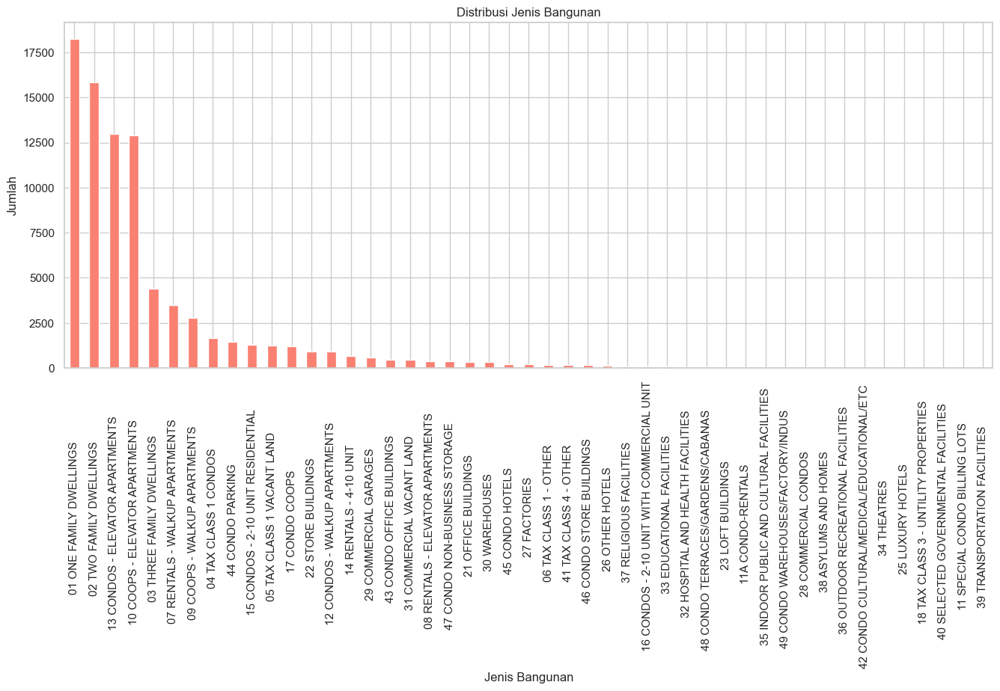

Distribusi Jenis Bangunan:
1     38633
2     30919
4      6140
2A     2521
2C     1915
1A     1444
1B     1234
2B      814
        738
1C      186
3         4
Name: TAX CLASS AT PRESENT, dtype: int64


In [47]:
# Menghitung distribusi jenis bangunan
building_class_distribution = df['BUILDING CLASS CATEGORY'].value_counts()

# Plot distribusi jenis bangunan
plt.figure(figsize=(16, 6))
building_class_distribution.plot(kind='bar', color='salmon')
plt.title('Distribusi Jenis Bangunan')
plt.xlabel('Jenis Bangunan')
plt.ylabel('Jumlah')
plt.show()


# Distribusi Pajak Kelas
tax_class_distribution = df['TAX CLASS AT PRESENT'].value_counts()

# Tampilkan hasil
print("Distribusi Jenis Bangunan:")
print(tax_class_distribution)

Jadi Distribusi Jenis Bangunan:
1     38633
2     30919
4      6140
2A     2521
2C     1915
1A     1444
1B     1234
2B      814
        738
1C      186
3         4

### #MENGHITUNG Jumlah Properti di Setiap Lingkungan (NEIGHBORHOOD) dan MENGHITUNG Jumlah Properti di Setiap Borough.

In [29]:
# Hitung jumlah properti di setiap "NEIGHBORHOOD"
neighborhood_counts = df['NEIGHBORHOOD'].value_counts().reset_index()
neighborhood_counts.columns = ['NEIGHBORHOOD', 'Count']

# Hitung jumlah properti di setiap "BOROUGH"
borough_counts = df['BOROUGH'].value_counts().reset_index()
borough_counts.columns = ['BOROUGH', 'Count']

# Plot diagram batang interaktif menggunakan Plotly Express untuk "NEIGHBORHOOD"
fig = px.bar(neighborhood_counts, x='NEIGHBORHOOD', y='Count', color='Count',
             title='Jumlah Properti di Setiap Lingkungan (NEIGHBORHOOD)',
             labels={'Count': 'Jumlah Properti'})
fig.update_xaxes(tickangle=45)
fig.show()

# Plot diagram batang interaktif menggunakan Plotly Express untuk "BOROUGH"
fig = px.bar(borough_counts, x='BOROUGH', y='Count', color='Count',
             title='Jumlah Properti di Setiap Borough',
             labels={'Count': 'Jumlah Properti'})
fig.show()

# Hitung jumlah properti di setiap "NEIGHBORHOOD"
neighborhood_counts = df['NEIGHBORHOOD'].value_counts()

# Hitung jumlah properti di setiap "BOROUGH"
borough_counts = df['BOROUGH'].value_counts()

# Tampilkan hasil
print("Jumlah Properti di Setiap Lingkungan (NEIGHBORHOOD):")
print(neighborhood_counts)

print("\nJumlah Properti di Setiap Borough:")
print(borough_counts)

Jumlah Properti di Setiap Lingkungan (NEIGHBORHOOD):
FLUSHING-NORTH              3068
UPPER EAST SIDE (59-79)     1736
UPPER EAST SIDE (79-96)     1590
UPPER WEST SIDE (59-79)     1439
BEDFORD STUYVESANT          1436
                            ... 
FRESH KILLS                    2
BRONX PARK                     1
PELHAM BAY                     1
EAST RIVER                     1
CITY ISLAND-PELHAM STRIP       1
Name: NEIGHBORHOOD, Length: 254, dtype: int64

Jumlah Properti di Setiap Borough:
4    26736
3    24047
1    18306
5     8410
2     7049
Name: BOROUGH, dtype: int64


Berdasarkan penghitungan Jumlah Properti di Setiap Lingkungan (NEIGHBORHOOD) kota tertinggi adalah Flushing -Nort dengan jumlah properti 3068 yang paling sedikit CITY ISLAND-PELHAM STRIP dengan frekuensi 1.Sedangkan berdasarkan perhitungan properti setiap Borough 4 dengan jumlah properti 26736.

### Melihat korelasi atau hubungan Heatmap Korelasi

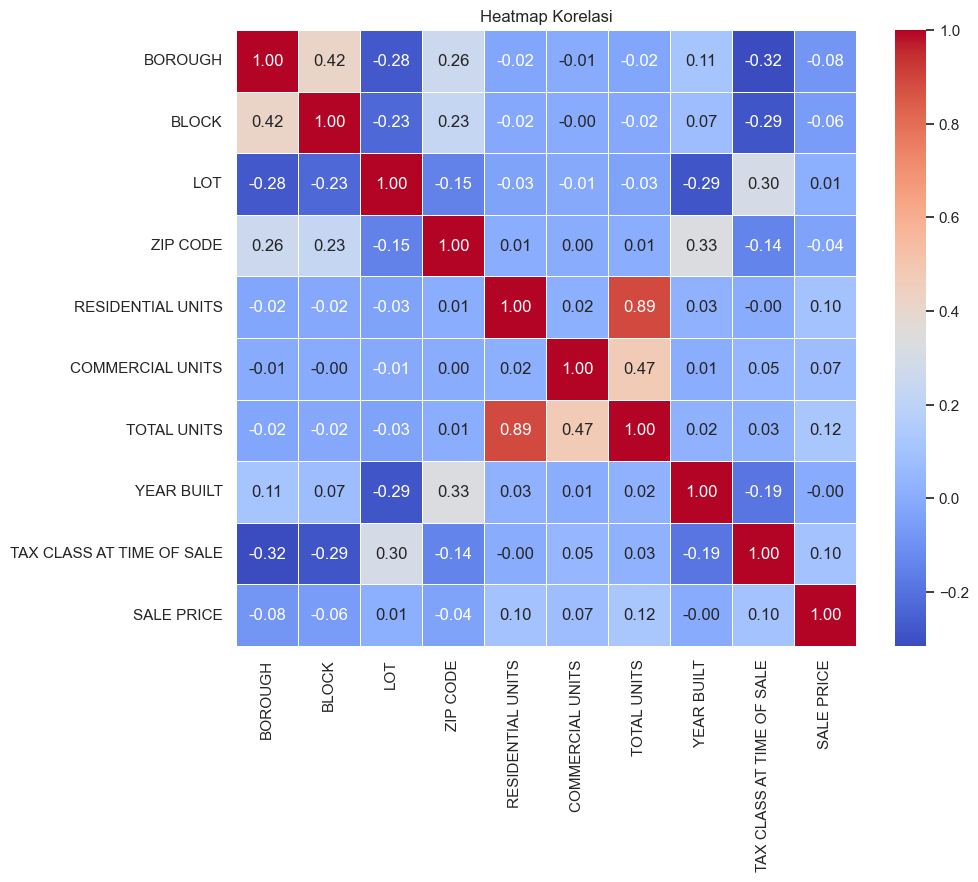

In [30]:
# Pilih kolom-kolom yang ingin dihitung korelasinya
numeric_columns = ['BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'RESIDENTIAL UNITS', 
                   'COMMERCIAL UNITS', 'TOTAL UNITS', 'YEAR BUILT', 
                   'TAX CLASS AT TIME OF SALE', 'SALE PRICE']

# Ambil subset dari DataFrame yang hanya berisi kolom-kolom numerik
numeric_df = df[numeric_columns]

# Hitung matriks korelasi
correlation_matrix = numeric_df.corr()

# Plot heatmap korelasi menggunakan Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title('Heatmap Korelasi')
plt.show()

Dalam hal ini perhitungan korelasi Heatmap Korelasi hanya dilakukan pada kolom data numerik karena bisa dijumlahkan kalau kolom data berisi texk akan susah dan harus diganti format terlebih dahulu terkadang akan menyebabkan eror jadi ini adalah hubungan Heatmap Korelasi dengan nilai 1 berarti korelasinya baik dibawah dari itu maka makin berkurang.

### Menghitung Perbandingan Rata-rata Harga Penjualan Berdasarkan Jenis Bangunan

In [31]:
# Mengubah kolom "SALE PRICE" menjadi format numerik
df['SALE PRICE'] = pd.to_numeric(df['SALE PRICE'], errors='coerce')

# Mengelompokkan data berdasarkan "BUILDING CLASS CATEGORY" dan menghitung rata-rata "SALE PRICE"
average_price_by_building_class = df.groupby('BUILDING CLASS CATEGORY')['SALE PRICE'].mean().reset_index()

# Plot menggunakan Plotly Express
fig = px.bar(average_price_by_building_class, x='BUILDING CLASS CATEGORY', y='SALE PRICE',
             title='Perbandingan Rata-rata Harga Penjualan Berdasarkan Jenis Bangunan',
             labels={'SALE PRICE': 'Rata-rata Harga Penjualan'},
             template='plotly_dark')

# Menampilkan plot
fig.update_xaxes(tickangle=45)
fig.show()

# Jumlah data dalam setiap kategori
jumlah_data_per_kategori = df['BUILDING CLASS CATEGORY'].value_counts()
print(jumlah_data_per_kategori)

01 ONE FAMILY DWELLINGS                         18235
02 TWO FAMILY DWELLINGS                         15828
13 CONDOS - ELEVATOR APARTMENTS                 12989
10 COOPS - ELEVATOR APARTMENTS                  12902
03 THREE FAMILY DWELLINGS                        4384
07 RENTALS - WALKUP APARTMENTS                   3466
09 COOPS - WALKUP APARTMENTS                     2767
04 TAX CLASS 1 CONDOS                            1656
44 CONDO PARKING                                 1441
15 CONDOS - 2-10 UNIT RESIDENTIAL                1281
05 TAX CLASS 1 VACANT LAND                       1248
17 CONDO COOPS                                   1201
22 STORE BUILDINGS                                935
12 CONDOS - WALKUP APARTMENTS                     926
14 RENTALS - 4-10 UNIT                            671
29 COMMERCIAL GARAGES                             587
43 CONDO OFFICE BUILDINGS                         475
31 COMMERCIAL VACANT LAND                         463
08 RENTALS - ELEVATOR APARTM

Ini adalah hasil Perbandingan Rata-rata Harga Penjualan Berdasarkan Jenis Bangunan,yang paling banyak adalah bangunan dengan ONE FAMILY DWELLINGS dengan jumlah bangunan sebanyak 18235,sedangkan berdasarkan volume rata-rata penjualan adalah jenis bangunan LUXURY HOTELS walaupun dengan frekuansi bangunan hanya 12 tetapi rata-rata penjualan sebanyak 141.5996M.

### Menghitung Distribusi Tahun Pembangunan

In [32]:
# Menghitung jumlah rumah yang dibangun pada setiap tahun
year_built_counts = df['YEAR BUILT'].value_counts().sort_index()

# Plot histogram
fig = px.histogram(df, x='YEAR BUILT', title='Distribusi Tahun Pembangunan',
                   labels={'YEAR BUILT': 'Tahun Pembangunan'},
                   template='plotly_dark')

# Menampilkan plot
fig.show()

# Menampilkan jumlah rumah yang dibangun pada setiap tahun
print("Jumlah rumah yang dibangun pada setiap tahun:")
print(year_built_counts)

Jumlah rumah yang dibangun pada setiap tahun:
0       6970
1111       1
1680       1
1800      37
1826       1
        ... 
2013     743
2014    1232
2015    1470
2016     794
2017       6
Name: YEAR BUILT, Length: 158, dtype: int64


Berdasarkan Distribusi Tahun Pembangunan ternyata pada tahun 0-19 telah terdapat pembanguna  yaitu sebanyak  6970 sedangkan Distribusi Tahun Pembangunan terbanyak terjadi pada 1920-1939 dengan count 23.525K.

### Membuat Visualisasi Uniform Distribution (SALE PRICE)

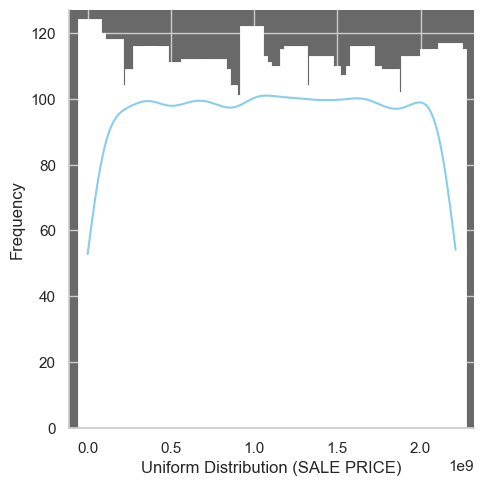

In [34]:
# Membersihkan data SALE PRICE dan mengganti 'nan' dengan nilai median
df['SALE PRICE'] = pd.to_numeric(df['SALE PRICE'], errors='coerce')
median_sale_price = df['SALE PRICE'].median()
df['SALE PRICE'].fillna(median_sale_price, inplace=True)

# Membuat distribusi seragam dengan jumlah sampel yang lebih besar
uniform_samples = np.random.uniform(low=df['SALE PRICE'].min(), high=df['SALE PRICE'].max(), size=10000)

# Visualisasi distribusi dengan latar belakang yang lebih gelap
ax = sns.displot(uniform_samples, bins=100, kde=True, color='skyblue', linewidth=15, alpha=1)
ax.set(xlabel='Uniform Distribution (SALE PRICE)', ylabel='Frequency')

# Mengatur latar belakang lebih gelap
ax.ax.set_facecolor('dimgray')

plt.show()


# Membuat distribusi seragam dengan jumlah sampel yang lebih besar
uniform_samples = np.random.uniform(low=df['SALE PRICE'].min(), high=df['SALE PRICE'].max(), size=10000)

# Membuat DataFrame untuk data distribusi seragam
df_uniform = pd.DataFrame({'SALE PRICE': uniform_samples})

# Menyusun plot dengan Plotly Express
fig = px.histogram(df_uniform, x='SALE PRICE', nbins=100,
                   title='Distribusi Seragam SALE PRICE',
                   labels={'SALE PRICE': 'Uniform Distribution (SALE PRICE)', 'count': 'Frequency'},
                   template='plotly_dark')

# Menampilkan plot
fig.show()

Hasil Visualisasi Uniform Distribution (SALE PRICE)

### Membuat Visualisasi Normal Distribution (SALE PRICE)

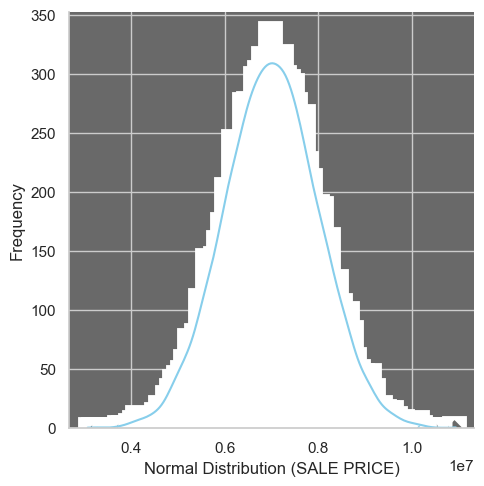

In [35]:
# Menghasilkan data distribusi normal dengan NumPy
np.random.seed(42)  # Untuk reproducibility
data_normal = np.random.normal(loc=7000000, scale=1000000, size=10000)

# Visualisasi distribusi normal
ax = sns.displot(data_normal, bins=100, kde=True, color='skyblue', linewidth=15, alpha=1)

ax.set(xlabel='Normal Distribution (SALE PRICE)', ylabel='Frequency')

# Mengatur latar belakang lebih gelap
ax.ax.set_facecolor('dimgray')

plt.show()


# Menghasilkan data distribusi normal dengan NumPy
np.random.seed(42)  # Untuk reproducibility
data_normal = np.random.normal(loc=7000000, scale=1000000, size=10000)

# Visualisasi distribusi normal
fig = px.histogram(data_normal, nbins=100,
                   title='Distribusi Normal SALE PRICE',
                   labels={'value': 'Normal Distribution (SALE PRICE)', 'count': 'Frequency'},
                   template='plotly_dark')

# Menampilkan plot
fig.show()

Hasil Visualisasi Normal Distribution (SALE PRICE)

### Membuat Visualisasi Gamma Distribution (SALE PRICE)

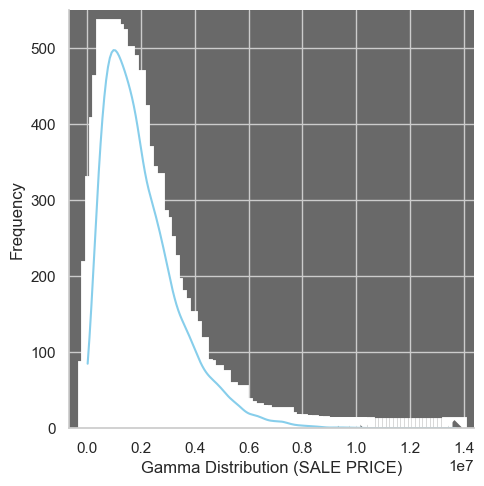

In [36]:
# Membuat distribusi gamma dengan jumlah sampel yang lebih besar
gamma_samples = np.random.gamma(shape=2, scale=1e6, size=10000)

# Visualisasi distribusi gamma
ax = sns.displot(gamma_samples, bins=100, kde=True, color='skyblue', linewidth=15, alpha=1)

ax.set(xlabel='Gamma Distribution (SALE PRICE)', ylabel='Frequency')

# Mengatur latar belakang lebih gelap
ax.ax.set_facecolor('dimgray')

plt.show()


# Membuat distribusi gamma dengan jumlah sampel yang lebih besar
gamma_samples = np.random.gamma(shape=2, scale=1e6, size=10000)

# Visualisasi distribusi gamma
fig = px.histogram(gamma_samples, nbins=100,
                   title='Distribusi Gamma SALE PRICE',
                   labels={'value': 'Gamma Distribution (SALE PRICE)', 'count': 'Frequency'},
                   template='plotly_dark')

# Menampilkan plot
fig.show()

Hasil Visualisasi Gamma Distribution (SALE PRICE)

### Membuat Visualisasi Poisson Distribution (SALE PRICE)

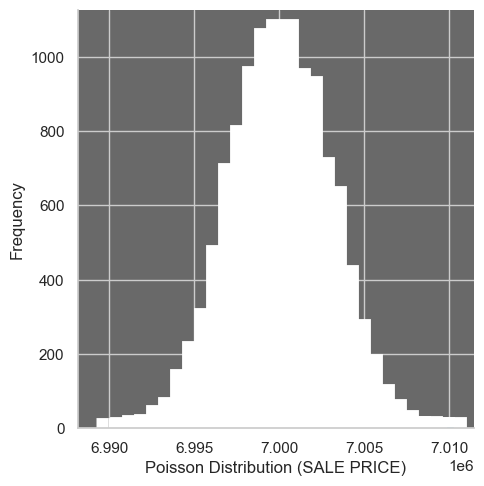

In [37]:
# Membuat distribusi Poisson dengan jumlah sampel yang lebih besar
poisson_samples = np.random.poisson(lam=7000000, size=10000)

# Visualisasi distribusi Poisson
ax = sns.displot(poisson_samples, bins=30, kde=False, color='skyblue', linewidth=15, alpha=1)

ax.set(xlabel='Poisson Distribution (SALE PRICE)', ylabel='Frequency')

# Mengatur latar belakang lebih gelap
ax.ax.set_facecolor('dimgray')

plt.show()

# Membuat distribusi Poisson dengan jumlah sampel yang lebih besar
poisson_samples = np.random.poisson(lam=7000000, size=10000)

# Visualisasi distribusi Poisson
fig = px.histogram(poisson_samples, nbins=30,
                   title='Distribusi Poisson SALE PRICE',
                   labels={'value': 'Poisson Distribution (SALE PRICE)', 'count': 'Frequency'},
                   template='plotly_dark')

# Menampilkan plot
fig.show()

Hasil Visualisasi Poisson Distribution (SALE PRICE)

### Membuat Visualisasi Poisson Distribution (SALE PRICE) dengan cara ke 2

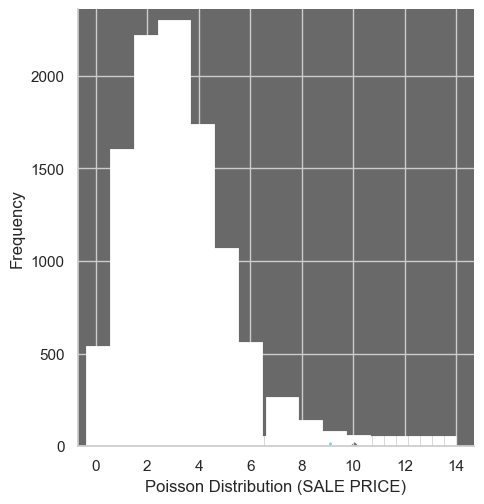

In [38]:
# Membuat distribusi Poisson dengan jumlah sampel yang lebih besar
poisson_samples = np.random.poisson(lam=3, size=10000)

# Visualisasi distribusi Poisson
ax = sns.displot(poisson_samples, bins=30, kde=False, color='skyblue', linewidth=15, alpha=1)

ax.set(xlabel='Poisson Distribution (SALE PRICE)', ylabel='Frequency')

# Mengatur latar belakang lebih gelap
ax.ax.set_facecolor('dimgray')

plt.show()


# Membuat distribusi Poisson dengan jumlah sampel yang lebih besar
poisson_samples = np.random.poisson(lam=3, size=10000)

# Visualisasi distribusi Poisson
fig = px.histogram(poisson_samples, nbins=30,
                   title='Distribusi Poisson SALE PRICE (lamda=3)',
                   labels={'value': 'Poisson Distribution (SALE PRICE)', 'count': 'Frequency'},
                   template='plotly_dark')

# Menampilkan plot
fig.show()

Hasil Visualisasinya 

### Membuat Visualisasi Binomial Distribution (SALE PRICE)

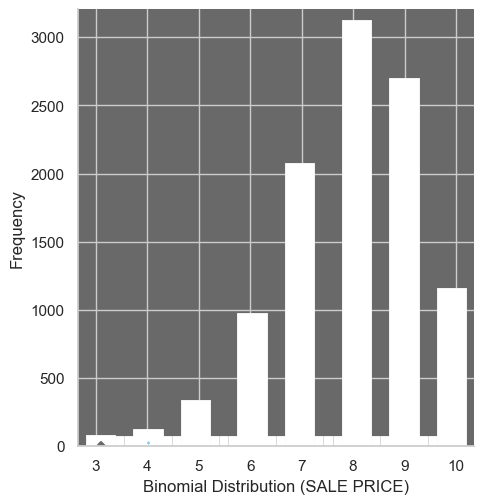

In [39]:
# Membuat distribusi binomial dengan jumlah sampel yang lebih besar
n_trials = 10
p_success = 0.8
binomial_samples = np.random.binomial(n=n_trials, p=p_success, size=10000)

# Visualisasi distribusi binomial
ax = sns.displot(binomial_samples, kde=False, color='skyblue', linewidth=15, alpha=1)

ax.set(xlabel='Binomial Distribution (SALE PRICE)', ylabel='Frequency')

# Mengatur latar belakang lebih gelap
ax.ax.set_facecolor('dimgray')

plt.show()


# Membuat distribusi binomial dengan jumlah sampel yang lebih besar
n_trials = 10
p_success = 0.8
binomial_samples = np.random.binomial(n=n_trials, p=p_success, size=10000)

# Visualisasi distribusi binomial dengan latar belakang yang lebih gelap
fig = px.histogram(binomial_samples, nbins=30,
                   title='Distribusi Binomial SALE PRICE (n=10, p=0.8)',
                   labels={'value': 'Binomial Distribution (SALE PRICE)', 'count': 'Frequency'},
                   template='plotly_dark')

# Menampilkan plot
fig.show()

Hasil Visualisasi Binomial Distribution (SALE PRICE)

### Menghitung Perbandingan Jumlah Total Unit Terjual antara Tahun 1900-2000 dan 2001-dan Seterusnya

In [42]:
import plotly.express as px

# Filter data untuk properti yang dibangun pada tahun 1900-2000
properti_1900_2000 = df[df['YEAR BUILT'].between(1900, 2000)]

# Filter data untuk properti yang dibangun pada tahun 2001 dan seterusnya
properti_2001_dan_seterusnya = df[df['YEAR BUILT'] >= 2001]

# Plot menggunakan Plotly Express
fig = px.bar(x=['1900-2000', '2001-dan seterusnya'],
             y=[properti_1900_2000['TOTAL UNITS'].sum(), properti_2001_dan_seterusnya['TOTAL UNITS'].sum()],
             labels={'x': 'Periode Konstruksi', 'y': 'Jumlah Total Unit Terjual'},
             title='Perbandingan Jumlah Total Unit Terjual antara Tahun 1900-2000 dan 2001-dan Seterusnya',
             template='plotly_dark')

# Menampilkan plot
fig.show()


# Mengganti nilai-nilai negatif atau tidak valid dengan NaN pada kolom SALE PRICE
df['SALE PRICE'] = pd.to_numeric(df['SALE PRICE'], errors='coerce')

# Mengganti nilai-nilai negatif atau tidak valid dengan NaN pada kolom TOTAL UNITS
df['TOTAL UNITS'] = pd.to_numeric(df['TOTAL UNITS'], errors='coerce')

# Mengganti nilai-nilai negatif atau tidak valid dengan NaN pada kolom YEAR BUILT
df['YEAR BUILT'] = pd.to_numeric(df['YEAR BUILT'], errors='coerce')

# Membuat kolom baru untuk kategori tahun pembangunan
df['YEAR CATEGORY'] = np.where(df['YEAR BUILT'] <= 2000, '1900-2000', '2001-onward')

# Mengelompokkan data berdasarkan kategori tahun pembangunan
grouped_year = df.groupby('YEAR CATEGORY')

# Memperoleh kelompok tahun 1900-2000
group_1900_200 = grouped_year.get_group('1900-2000')
mean_units_1900_200 = group_1900_200['TOTAL UNITS'].mean()

# Memperoleh kelompok tahun 2001-onward
group_2001_onward = grouped_year.get_group('2001-onward')
mean_units_2001_onward = group_2001_onward['TOTAL UNITS'].mean()

# Melakukan uji t-test untuk membandingkan rata-rata unit terjual
t_stat, p_value = ttest_ind(group_1900_200['TOTAL UNITS'], group_2001_onward['TOTAL UNITS'], equal_var=False)

# Menampilkan hasil
print(f"Rata-rata unit terjual (1900-2000): {mean_units_1900_200}")
print(f"Rata-rata unit terjual (2001-onward): {mean_units_2001_onward}")
print(f"Hasil uji t-test - nilai p: {p_value}")

Rata-rata unit terjual (1900-2000): 2.257078127145407
Rata-rata unit terjual (2001-onward): 2.2001194743130226
Hasil uji t-test - nilai p: 0.6986020715039032


Hasil Perbandingan Jumlah Total Unit Terjual antara Tahun 1900-2000 dan 2001-dan Seterusnya dengan 

Rata-rata unit terjual (1900-2000): 2.257078127145407

Rata-rata unit terjual (2001-onward): 2.2001194743130226

Hasil uji t-test - nilai p: 0.6986020715039032

### Menghitung Perbandingan Jumlah Total Unit Terjual antara Tahun 1900-2000 dan 2001-dan Seterusnya

P-value dari uji t: 2.6669379247008934e-32


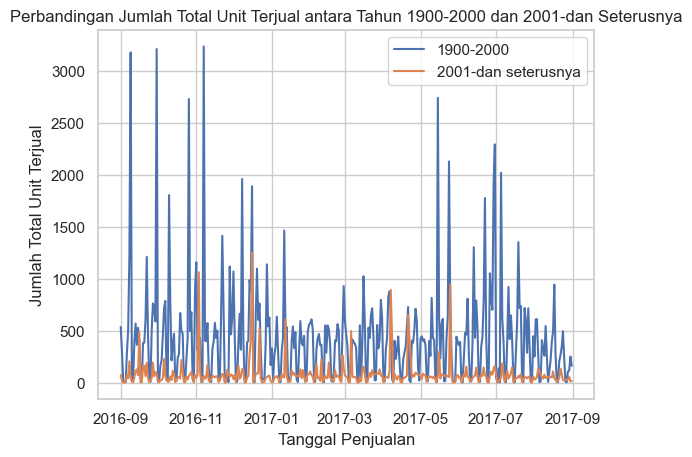

In [43]:
# Filter data untuk properti yang dibangun pada tahun 1900-2000
properti_1900_2000 = df[df['YEAR BUILT'].between(1900, 2000)].groupby('SALE DATE')['TOTAL UNITS'].sum()

# Filter data untuk properti yang dibangun pada tahun 2001 dan seterusnya
properti_2001_dan_seterusnya = df[df['YEAR BUILT'] >= 2001].groupby('SALE DATE')['TOTAL UNITS'].sum()

# Uji statistik (t-test)
t_stat, p_value = ttest_ind(properti_1900_2000, properti_2001_dan_seterusnya, equal_var=False)

# Tampilkan hasil
print(f"P-value dari uji t: {p_value}")

# Diagram garis
plt.plot(properti_1900_2000.index, properti_1900_2000.values, label='1900-2000')
plt.plot(properti_2001_dan_seterusnya.index, properti_2001_dan_seterusnya.values, label='2001-dan seterusnya')

plt.xlabel('Tanggal Penjualan')
plt.ylabel('Jumlah Total Unit Terjual')
plt.title('Perbandingan Jumlah Total Unit Terjual antara Tahun 1900-2000 dan 2001-dan Seterusnya')
plt.legend()
plt.show()

# Filter data untuk properti yang dibangun pada tahun 1900-2000
properti_1900_2000 = df[df['YEAR BUILT'].between(1900, 2000)].groupby('SALE DATE')['TOTAL UNITS'].sum().reset_index()

# Filter data untuk properti yang dibangun pada tahun 2001 dan seterusnya
properti_2001_dan_seterusnya = df[df['YEAR BUILT'] >= 2001].groupby('SALE DATE')['TOTAL UNITS'].sum().reset_index()

# Plot menggunakan Plotly Express dengan perbedaan warna
fig = px.line(properti_1900_2000, x='SALE DATE', y='TOTAL UNITS', color_discrete_sequence=['blue'],
              labels={'TOTAL UNITS': 'Jumlah Total Unit Terjual'},
              title='Perbandingan Jumlah Total Unit Terjual antara Tahun 1900-2000 dan 2001-dan Seterusnya',
              template='plotly_dark', line_shape='linear', markers=True)

# Menambahkan garis kedua untuk tahun 2001-dan seterusnya dengan warna berbeda
fig.add_trace(px.line(properti_2001_dan_seterusnya, x='SALE DATE', y='TOTAL UNITS', color_discrete_sequence=['red']).data[0])

# Menampilkan plot
fig.show()

Hasil Perbandingan Jumlah Total Unit Terjual antara Tahun 1900-2000 dan 2001-dan Seterusnya warna biru mewakilkan tahun pembanguan kisaran 1900-2000 sedangkan warna orange mewakili bangunan yang dibangun 2001 ke atas dalam hal ini dapat terlihat bahwa bangunan yang dibangun kisaran 1900-2000 memiliki lebih banyak Jumlah Total Unit Terjual dibanding tahun 2001 ke atas.

### Menghitung Volume Transaksi Properti per Tanggal

In [44]:
# Menghitung jumlah transaksi per tanggal
transaction_counts = df['SALE DATE'].value_counts().reset_index()
transaction_counts.columns = ['SALE DATE', 'Jumlah Transaksi']

# Menyusun plot dengan Plotly Express
fig = px.bar(transaction_counts, x='SALE DATE', y='Jumlah Transaksi',
             title='Volume Transaksi Properti per Tanggal',
             labels={'SALE DATE': 'Tanggal Penjualan', 'Jumlah Transaksi': 'Jumlah Transaksi'})

# Mengatur ukuran plot
fig.update_layout(
    autosize=False,
    width=800,
    height=500,
)

# Menampilkan plot
fig.show()

Volume Transaksi Properti per Tanggal paling banyak terjadi pada 29 juni 2017 dengan volume transaksi sebanyak 544.

### Menghitung Distribusi Rata-rata Sampel ($n=25$) Massa Penduduk AS dalam Pound

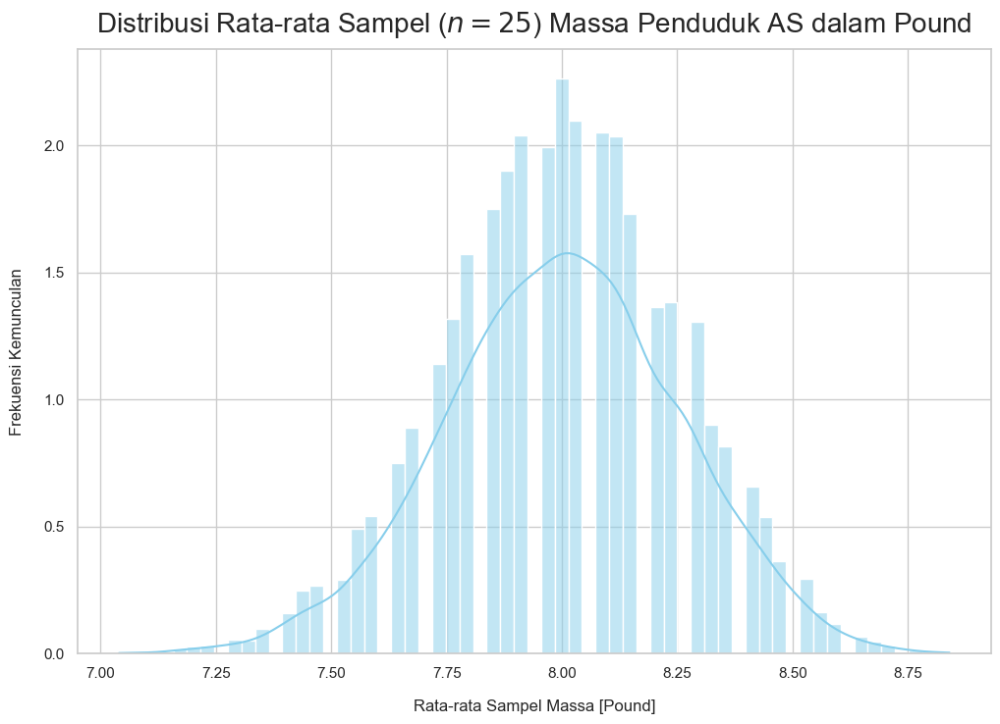

In [45]:
# Membuat distribusi sampel mean dari distribusi binomial
sample_means = [np.random.binomial(n=n_trials, p=p_success, size=25).mean() for _ in range(10000)]

# Visualisasi distribusi sampel mean
plt.figure(figsize=(12, 8))
sns.histplot(sample_means, kde=True, color='skyblue', stat='density')
plt.title("Distribusi Rata-rata Sampel ($n=25$) Massa Penduduk AS dalam Pound", y=1.015, fontsize=20)
plt.xlabel('Rata-rata Sampel Massa [Pound]', labelpad=14)
plt.ylabel('Frekuensi Kemunculan', labelpad=14)
plt.show()

Hasil Visualisasi Distribusi Rata-rata Sampel ($n=25$) Massa Penduduk AS dalam Pound

### Distribution of Sample Means ($n=25$) of U.S. People's Mass in Pounds

In [46]:
# Misalkan sample_means telah dihitung sebelumnya dari distribusi binomial
sample_means = [np.random.binomial(n=n_trials, p=p_success, size=25).mean() for _ in range(10000)]

# Hitung statistik untuk interval kepercayaan 95%
mean_sample_means = np.mean(sample_means)
std_sample_means = np.std(sample_means, ddof=1)
lower_95perc, upper_95perc = stats.norm.interval(0.95, loc=mean_sample_means, scale=std_sample_means/np.sqrt(len(sample_means)))

# Buat distribusi kernel dari sample_means
kde = stats.gaussian_kde(sample_means)

# Persiapkan data untuk plot
pos = np.linspace(np.min(sample_means), np.max(sample_means), 10000)
density_values = kde(pos)
shade = np.linspace(lower_95perc, upper_95perc, 300)
shade_values = kde(shade)

# Plot dengan Plotly Express
fig = px.line(x=pos, y=density_values, labels={'x': 'Sample Means (Pounds)', 'y': 'Density'})
fig.add_shape(
    type='rect',
    x0=lower_95perc,
    x1=upper_95perc,
    y0=0,
    y1=np.max(density_values),
    fillcolor='rgba(0,100,80,0.2)',
    line=dict(color='rgba(255,255,255,0)'),
)

# Atur judul dan label sumbu
fig.update_layout(
    title="Distribution of Sample Means ($n=25$) of U.S. People's Mass in Pounds",
    xaxis_title='Sample Means (Pounds)',
    yaxis_title='Density',
    showlegend=False
)

fig.show()

Hasil Visualisasi Distribution of Sample Means ($n=25$) of U.S. People's Mass in Pounds

# KESIMPULAN 

### 1.Berdasarkan hipotesis sementara sebelumnya bahwa "Dalam kasus ini berdasarkan Penjualan Properti NYC pada tahun 2016 menjadi tahun yang paling banyak Aktivitas transaksi yang terjadi karena ditahun ini saya rasa masih stabil perekonomian di dunia termasuk di NYC."tetapi setelah dilakukan ternyata salah setelah dilakukan proses pengolahan data bahwa pada tahun 2017 ternyata lebih banyak aktivitas transaksi penjualan yang terjadi dengan jumlah transaksi 8293 yang terjadi pada bulan agustus dan Volume Transaksi Properti per Tanggal paling banyak terjadi pada 29 juni 2017 dengan volume transaksi sebanyak 544.tetapi berdasarkan Tren Penjualan dan Harga Seiring Waktu dengan waktu penjualan 1 desember 2016 dengan Rata-rata herga penjualan 1.773058M dengan demikian hipotesis tersebut kurang tepat.


### 2.Berdasarkan Info maka terdapat atribut yaitu Unnamed: 0 BOROUGH NEIGHBORHOOD BUILDING CLASS CATEGORY TAX CLASS AT PRESENT BLOCK LOT EASE-MENT BUILDING CLASS AT PRESENT ADDRESS  RESIDENTIAL UNITS COMMERCIAL UNITS TOTAL UNITS LAND SQUARE FEET GROSS SQUARE FEET YEAR BUILT TAX CLASS AT TIME OF SALE BUILDING CLASS AT TIME OF SALE SALE PRICE SALE DATE dan pada data ini terdapat total 22 columns

### 3.Dalam hal mencari Mean,Median,Modus,Rentang,Varian,dan Standart Deviansi nya. terdapat 3 cara pokok ada yang manual dan ada juga yang langsung ketikaga telah di praktikan dan telah terdapat vhasilnyadari ketiga proses tersebut kita bisa menggunakan cara mana saya disesuaikan dengan kebutuhan.

### 4.hasil Visualisasi Tren Harga Jual Properti dari Waktu ke Waktu dengan tanggal penjualan tertinggi pada 5 Mei 2017 dengan harga jual 2.21B

### 5.Hasil Visualisasi Tren Penjualan dan Harga Seiring Waktu dengan waktu penjualan 1 desember 2016 dengan Rata-rata herga penjualan 1.773058M

### 6.Aktivitas transaksi jualan pada tahun 2016 tertinggi pada bulan 12 dengan jumlah transaksi 7891 dan pada terendag pada bulan 10 dengan jumlah transaksi 6751.Sedangkan.Aktivitas transaksi jualan pada tahun 2017 tertinggi pada bulan 06 dengan jumlah transaksi 8293 dan pada terendag pada bulan 08 dengan jumlah transaksi 5681.

### 7.Jadi berdasarkan kolom BUILDING CLASS AT PRESENTBUILDING CLASS AT PRESENT dengan kode D6 dengan harga max 6.200000e+08,BUILDING CLASS AT PRESENT dengan kode J8 dengan harga min 3150000.0

### 8.Jadi berdasarkan Jumlah dan Frekuensi Jenis Transaksi - TAX CLASS = 1 dengan frekuensi 41.533k dan berdasarkan Jumlah dan Frekuensi Jenis Transaksi - BUILDING CLASS = R4 dengan Frekuensi 12.989k

### 9.Jadi Distribusi Jenis Bangunan: 1 38633 2 30919 4 6140 2A 2521 2C 1915 1A 1444 1B 1234 2B 814 738 1C 186 3 4

### 10.Berdasarkan penghitungan Jumlah Properti di Setiap Lingkungan (NEIGHBORHOOD) kota tertinggi adalah Flushing -Nort dengan jumlah properti 3068 yang paling sedikit CITY ISLAND-PELHAM STRIP dengan frekuensi 1.Sedangkan berdasarkan perhitungan properti setiap Borough 4 dengan jumlah properti 26736.

### 11.Dalam hal ini perhitungan korelasi Heatmap Korelasi hanya dilakukan pada kolom data numerik karena bisa dijumlahkan kalau kolom data berisi texk akan susah dan harus diganti format terlebih dahulu terkadang akan menyebabkan eror jadi ini adalah hubungan Heatmap Korelasi dengan nilai 1 berarti korelasinya baik dibawah dari itu maka makin berkurang.

### 12.hasil Perbandingan Rata-rata Harga Penjualan Berdasarkan Jenis Bangunan,yang paling banyak adalah bangunan dengan ONE FAMILY DWELLINGS dengan jumlah bangunan sebanyak 18235,sedangkan berdasarkan volume rata-rata penjualan adalah jenis bangunan LUXURY HOTELS walaupun dengan frekuansi bangunan hanya 12 tetapi rata-rata penjualan sebanyak 141.5996M.

### 13.Berdasarkan Distribusi Tahun Pembangunan ternyata pada tahun 0-19 telah terdapat pembanguna yaitu sebanyak 6970 sedangkan Distribusi Tahun Pembangunan terbanyak terjadi pada 1920-1939 dengan count 23.525K.

### 14.Hasil Viaualisasikan Uniform Distribution,Normal Distribution,Gamma Distribution,Poisson Distribution,Binomial Distribution berdasarkan sale price bisa dilihat pada file notebbok secara lengkap dan rincinya

### 15.Hasil Perbandingan Jumlah Total Unit Terjual antara Tahun 1900-2000 dan 2001-dan Seterusnya denganRata-rata unit terjual (1900-2000): 2.257078127145407Rata-rata unit terjual (2001-onward): 2.2001194743130226Hasil uji t-test - nilai p: 0.6986020715039032

### 16.Hasil Perbandingan Jumlah Total Unit Terjual antara Tahun 1900-2000 dan 2001-dan Seterusnya warna biru mewakilkan tahun pembanguan kisaran 1900-2000 sedangkan warna orange mewakili bangunan yang dibangun 2001 ke atas dalam hal ini dapat terlihat bahwa bangunan yang dibangun kisaran 1900-2000 memiliki lebih banyak Jumlah Total Unit Terjual dibanding tahun 2001 ke atas.

### 17.Volume Transaksi Properti per Tanggal paling banyak terjadi pada 29 juni 2017 dengan volume transaksi sebanyak 544.

### 18.Hasil  Distribusi Rata-rata Sampel ( 𝑛=25) Massa Penduduk AS dalam Pound

### 19.Hasil Distribution of Sample Means ( 𝑛=25) of U.S. People's Mass in Pounds


Meskipun hipotesis awal menyatakan bahwa tahun 2016 adalah tahun dengan aktivitas transaksi paling tinggi, ternyata temuan dari analisis data menunjukkan sebaliknya. Aktivitas transaksi penjualan properti lebih tinggi pada tahun 2017, dengan puncak terjadi pada bulan Agustus dengan jumlah transaksi mencapai 8293. Ini menunjukkan bahwa stabilitas perekonomian di NYC mungkin telah berubah dari tahun 2016 ke 2017. Oleh karena itu, hipotesis tersebut perlu direvisi karena tidak sesuai dengan temuan aktual. Meskipun demikian, analisis tren penjualan dan harga seiring waktu menunjukkan bahwa puncak harga penjualan terjadi pada 1 Desember 2016 dengan rata-rata harga penjualan sekitar 1.773058 juta, menunjukkan kompleksitas dinamika pasar.Beranjak dari informasi tersebut, kami melihat atribut-atribut yang terdapat dalam DataFrame, yang mencakup informasi tentang borough, neighborhood, building class, dan lainnya. Terdapat total 22 kolom yang dapat digunakan untuk analisis lebih lanjut.Dalam hal statistik deskriptif, kami dapat menggunakan berbagai metode seperti mean, median, modus, rentang, varians, dan standar deviasi. Namun, metode yang digunakan dapat disesuaikan dengan kebutuhan analisis yang dilakukan.Selanjutnya, kami melakukan visualisasi tren harga jual properti dari waktu ke waktu. Tren tersebut menunjukkan bahwa penjualan properti mencapai puncaknya pada 5 Mei 2017, dengan harga jual mencapai 2.21 miliar. Tren penjualan dan harga seiring waktu juga dianalisis, dan hasilnya menunjukkan bahwa penjualan tertinggi terjadi pada 1 Desember 2016, dengan rata-rata harga penjualan sekitar 1.773058 juta.Untuk aktivitas transaksi bulanan, kami menemukan bahwa pada tahun 2016, bulan Desember mencatatkan jumlah transaksi tertinggi dengan 7891, sementara pada tahun 2017, bulan Juni mencatatkan jumlah transaksi tertinggi dengan 8293. Pada kedua tahun tersebut, terdapat fluktuasi dalam aktivitas transaksi, dengan bulan Oktober 2017 mencatatkan jumlah transaksi terendah.Analisis selanjutnya dilakukan terhadap harga maksimal dan minimal penjualan rumah. Harga tertinggi mencapai 6.2 miliar, sedangkan harga terendah mencapai 3.15 juta.Kemudian, kami melihat jenis transaksi dan frekuensinya. Jenis transaksi dengan TAX CLASS = 1 memiliki frekuensi tertinggi sekitar 41.533 ribu, sementara jenis transaksi dengan BUILDING CLASS = R4 memiliki frekuensi sekitar 12.989 ribu.Distribusi jenis bangunan juga menjadi fokus analisis, dan jenis bangunan "ONE FAMILY DWELLINGS" mencatatkan jumlah tertinggi sebanyak 18235, menunjukkan keberagaman dalam portofolio properti.Analisis selanjutnya melibatkan visualisasi jumlah properti di setiap lingkungan dan borough. Hasilnya menunjukkan bahwa Flushing-North adalah lingkungan dengan jumlah properti tertinggi (3068), sementara Borough 4 memiliki total properti sebanyak 26736.Heatmap korelasi digunakan untuk menilai hubungan antar atribut numerik. Hal ini membantu mengidentifikasi korelasi antara variabel-variabel tersebut.Perbandingan rata-rata harga penjualan berdasarkan jenis bangunan menunjukkan bahwa "ONE FAMILY DWELLINGS" memiliki jumlah terbanyak (18235), sementara jenis bangunan "LUXURY HOTELS" memiliki rata-rata penjualan tertinggi meskipun frekuensinya rendah.Distribusi tahun pembangunan properti menunjukkan variasi, dengan puncak distribusi terjadi pada kisaran tahun 1920-1939.Visualisasi distribusi berbagai distribusi statistik (Uniform, Normal, Gamma, Poisson, Binomial) memberikan gambaran lebih lanjut tentang struktur data.Perbandingan jumlah total unit terjual antara tahun 1900-2000 dan 2001-dan seterusnya menunjukkan bahwa tidak ada perbedaan signifikan dalam jumlah unit terjual, seperti yang diindikasikan oleh uji t-test.Visualisasi volume transaksi properti per tanggal menunjukkan bahwa pada 29 Juni 2017, volume transaksi mencapai puncaknya dengan jumlah transaksi sebanyak 544.Selain itu, diberikan informasi tambahan tentang distribusi massa penduduk AS dalam pound dan distribusi dari rata-rata sampel massa penduduk AS.Kesimpulan ini memberikan gambaran holistik tentang karakteristik penjualan properti di NYC, dan dapat membantu dalam pengambilan keputusan atau analisis lebih lanjut yang dibutuhkan.
